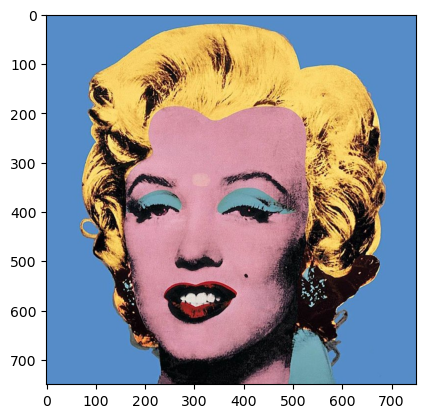

In [20]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.colors as colors
mb = cv2.imread('Marilyn_blue.png')
mb= cv2.cvtColor(mb, cv2.COLOR_BGR2RGB)
plt.imshow(mb)
plt.show()

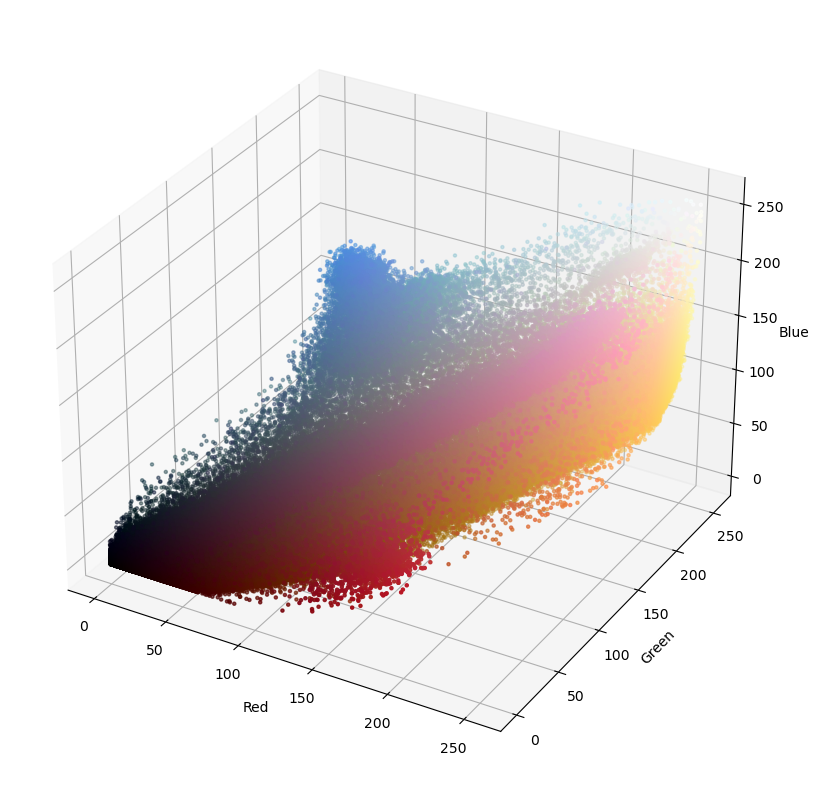

In [21]:


image_names = ['Marilyn_blue.png', 'Marilyn_green.png', 'Marilyn_orange.png', 'Marilyn_red.png', 'Marilyn_teal.png']

r, g, b = cv2.split(mb)
fig = plt.figure(figsize=(10, 10))
axis = fig.add_subplot(1, 1, 1, projection="3d")

pixel_colors = mb.reshape((np.shape(mb)[0]*np.shape(mb)[1], 3))
norm = colors.Normalize(vmin=-1.,vmax=1.)
norm.autoscale(pixel_colors)
pixel_colors = norm(pixel_colors).tolist()


axis.scatter(r.flatten(), g.flatten(), b.flatten(), facecolors=pixel_colors, marker=".")
axis.set_xlabel("Red")
axis.set_ylabel("Green")
axis.set_zlabel("Blue")


plt.show()

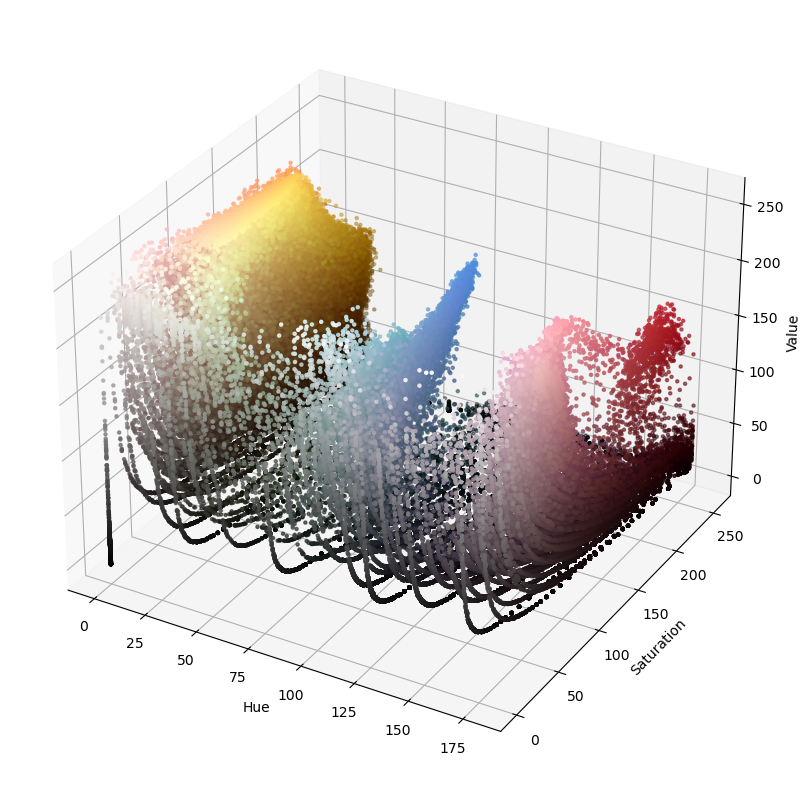

In [22]:
hsv_mb = cv2.cvtColor(mb, cv2.COLOR_RGB2HSV)
h, s, v = cv2.split(hsv_mb)
fig = plt.figure(figsize=(10, 10))
axis = fig.add_subplot(1, 1, 1, projection="3d")

axis.scatter(h.flatten(), s.flatten(), v.flatten(), facecolors=pixel_colors, marker=".")
axis.set_xlabel("Hue")
axis.set_ylabel("Saturation")
axis.set_zlabel("Value")
plt.show()

In [23]:
import colorsys

def rgb_to_hsv(rgb):
    # Normalize the RGB values
    r, g, b = rgb[0] / 255.0, rgb[1] / 255.0, rgb[2] / 255.0

    # Convert RGB to HSV
    hsv = colorsys.rgb_to_hsv(r, g, b)

    # Scale the HSV values to their respective ranges
    h, s, v = hsv[0] * 179, hsv[1] * 255, hsv[2] * 255

    return (h,s,v)

rgb_to_hsv((113,165,178))

(95.46666666666664, 93.1179775280899, 178.0)

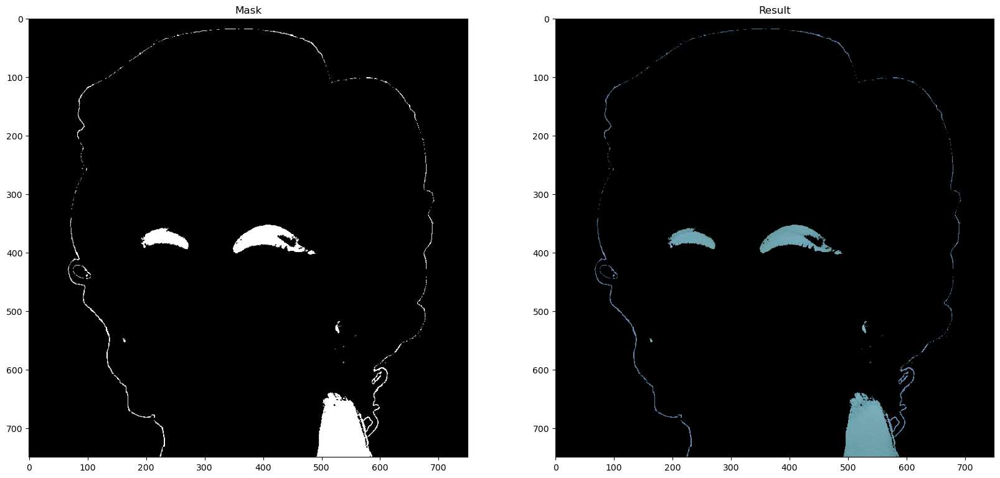

In [24]:
rgb_value=(113,165,178)


hsv_value = rgb_to_hsv(rgb_value)
tolerance = 30

# Calculate the lower and upper bounds for masking
lower_mb = np.array([hsv_value[0] - tolerance, hsv_value[1] - tolerance, hsv_value[2] - tolerance])
upper_mb = np.array([hsv_value[0] + tolerance, hsv_value[1] + tolerance, hsv_value[2] + tolerance])


mask = cv2.inRange(hsv_mb, lower_mb, upper_mb)
result = cv2.bitwise_and(mb, mb, mask=mask)

fig = plt.figure(figsize=(20, 20))
plt.subplot(1, 2, 1)
plt.imshow(mask, cmap="gray")
plt.title('Mask')
plt.subplot(1, 2, 2)
plt.imshow(result)
plt.title('Result')
plt.show()

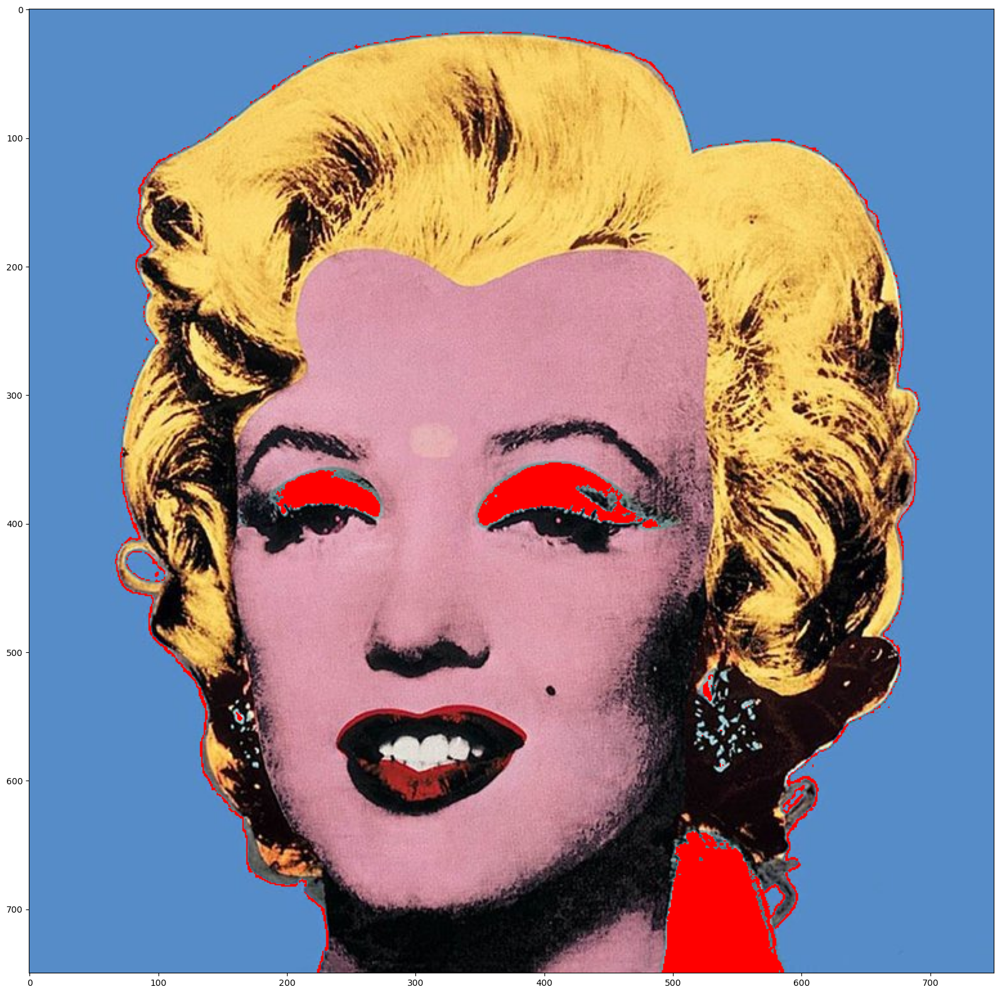

In [25]:
new_color = (255, 0, 0)

modified_eyeshadow = np.where(result > 0, new_color, mb)

# Combine the modified eyeshadow region with the rest of the original image

fig = plt.figure(figsize=(20, 20))
plt.imshow(modified_eyeshadow)

plt.show()

# Region of Interest approach 

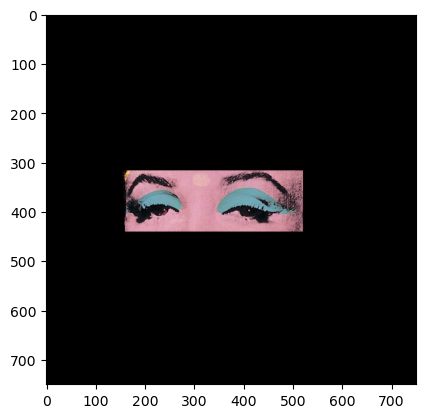

In [26]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the image
image = cv2.imread('Marilyn_blue.png')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  

# Define the Region of Interest (ROI) coordinates
roi_vertices = [(155, 317), (520, 317), (520, 440), (160, 440)]

# Create a black image with the same dimensions as the original image
mask = np.zeros_like(image)

# Fill the ROI into the mask
cv2.fillPoly(mask, np.array([roi_vertices], dtype=np.int32), (255,255,255))

# Applying the mask to the image
roi_image = cv2.bitwise_and(image, mask)

# Display the image using Matplotlib
plt.imshow(roi_image)
plt.show()


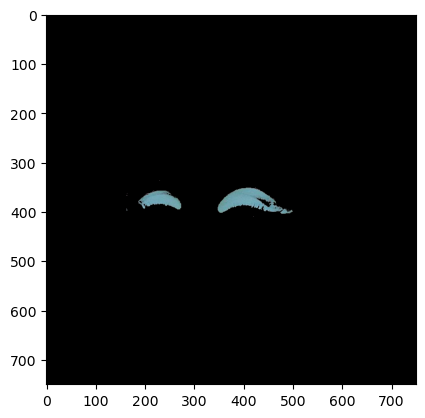

In [27]:
# Load the image
image = cv2.imread('Marilyn_blue.png')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  

# Define the Region of Interest (ROI) coordinates
roi_vertices = [(155, 317), (520, 317), (520, 440), (160, 440)]

# Create a black image with the same dimensions as the original image
mask = np.zeros_like(image)

# Fill the ROI into the mask
cv2.fillPoly(mask, np.array([roi_vertices], dtype=np.int32), (255,255,255))

# Applying the mask to the image
roi_image = cv2.bitwise_and(image, mask)

# Convert the ROI to HSV
hsv_roi = cv2.cvtColor(roi_image, cv2.COLOR_RGB2HSV)

# Define the HSV range for the eyeshadow color
rgb_value=(113,165,178)
hsv_value = rgb_to_hsv(rgb_value)
tolerance = 65
lower_color = np.clip([hsv_value[0] - tolerance, hsv_value[1] - tolerance, hsv_value[2] - tolerance], 0, 255)
upper_color = np.clip([hsv_value[0] + tolerance, hsv_value[1] + tolerance, hsv_value[2] + tolerance], 0, 255)

# Create a mask for the eyeshadow color
mask_eyeshadow = cv2.inRange(hsv_roi, lower_color, upper_color)

# Apply the mask to the ROI
result = cv2.bitwise_and(roi_image, roi_image, mask=mask_eyeshadow)

# Display the image using Matplotlib
plt.imshow(result)
plt.show()

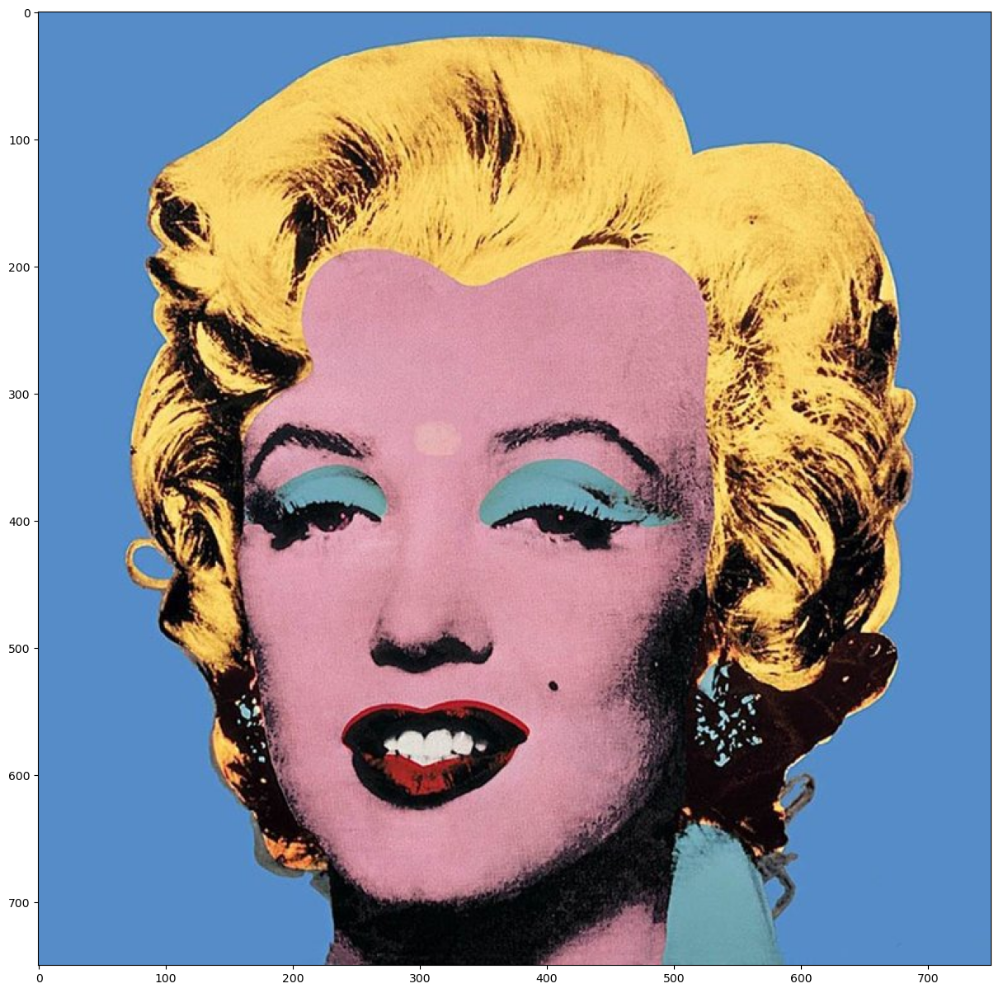

In [42]:
# Define the new color
new_color = (255, 0, 0)

# Change the color of the eyeshadow in the ROI
modified_eyeshadow = np.where(result > 0, new_color, roi_image)

# Combine the modified ROI with the rest of the original image
combined_image = image.copy()
combined_image[mask > 0] = modified_eyeshadow[mask > 0]

# Display the image
plt.figure(figsize=(15, 15))
plt.imshow(combined_image)
plt.show()


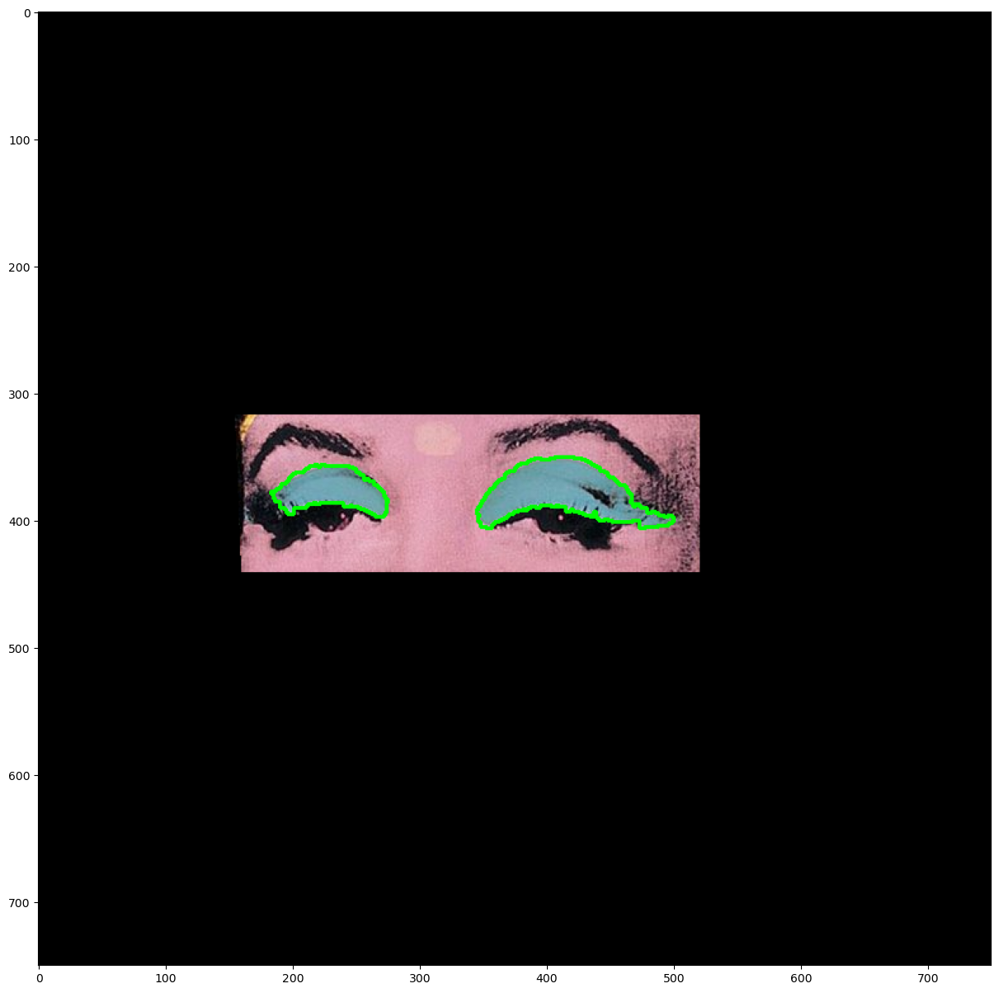

In [43]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import colorsys

# Function to convert RGB to HSV
def rgb_to_hsv(rgb):
    r, g, b = rgb[0] / 255.0, rgb[1] / 255.0, rgb[2] / 255.0
    hsv = colorsys.rgb_to_hsv(r, g, b)
    h, s, v = hsv[0] * 179, hsv[1] * 255, hsv[2] * 255
    return (h,s,v)

# Load the image
image = cv2.imread('Marilyn_blue.png')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  

# Define the Region of Interest (ROI) coordinates
roi_vertices = [(155, 317), (520, 317), (520, 440), (160, 440)]

# Create a black image with the same dimensions as the original image
mask = np.zeros_like(image)

# Fill the ROI into the mask
cv2.fillPoly(mask, np.array([roi_vertices], dtype=np.int32), (255,255,255))

# Applying the mask to the image
roi_image = cv2.bitwise_and(image, mask)

# Convert the ROI to HSV
hsv_roi = cv2.cvtColor(roi_image, cv2.COLOR_RGB2HSV)

# Define the HSV range for the eyeshadow color
rgb_value=(113,165,178)
hsv_value = rgb_to_hsv(rgb_value)
tolerance = 70
lower_color = np.clip([hsv_value[0] - tolerance, hsv_value[1] - tolerance, hsv_value[2] - tolerance], 0, 255)
upper_color = np.clip([hsv_value[0] + tolerance, hsv_value[1] + tolerance, hsv_value[2] + tolerance], 0, 255)

# Create a mask for the eyeshadow color
mask_eyeshadow = cv2.inRange(hsv_roi, lower_color, upper_color)

# Apply Gaussian blur to the mask
blurred_mask = cv2.GaussianBlur(mask_eyeshadow, (3, 3), 0)

# Find the contours of the eyeshadow
contours, _ = cv2.findContours(blurred_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# Define the minimum contour area
min_contour_area = 300  

# Draw the contours on the image
for contour in contours:
    if cv2.contourArea(contour) > min_contour_area:
        cv2.drawContours(roi_image, [contour], -1, (0, 255, 0), 2)

# Display the image
plt.figure(figsize=(15, 15))
plt.imshow(roi_image)
plt.show()


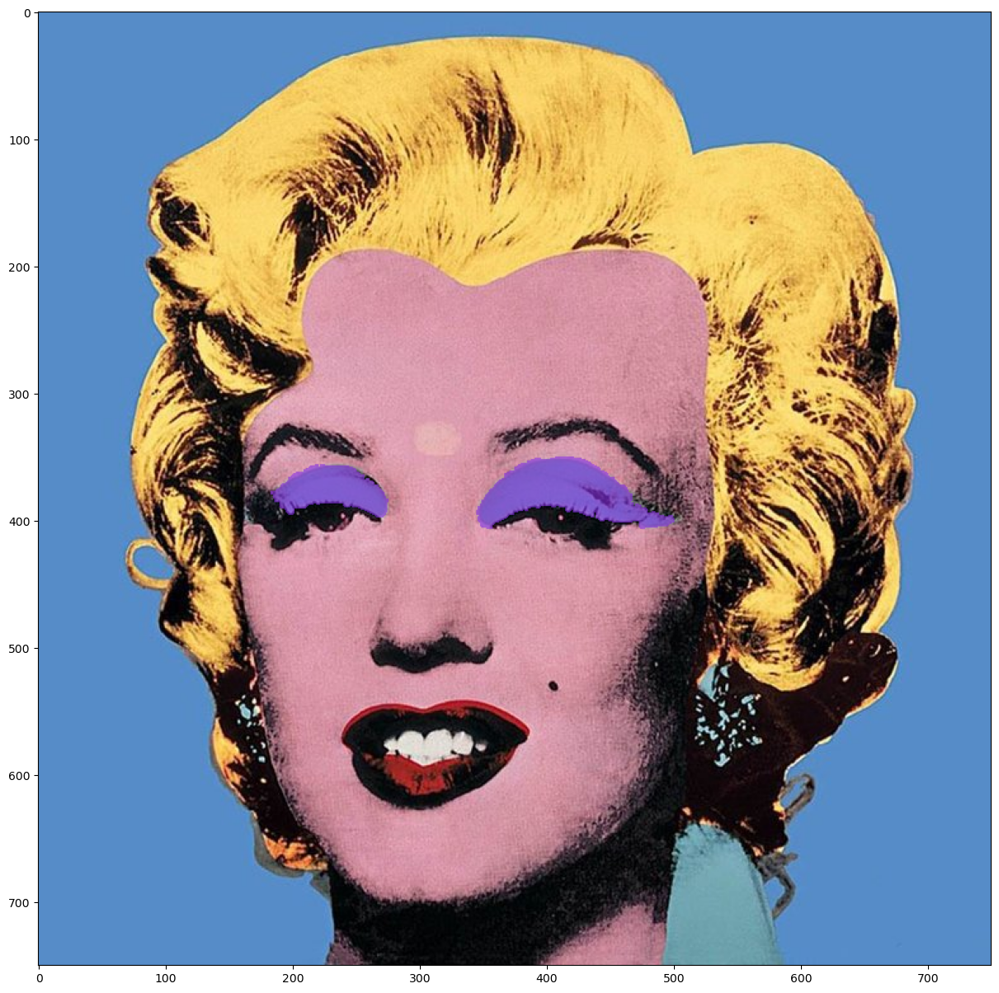

In [44]:
# Define the new color and the alpha value
new_color = (138,43,226)  
alpha = 0.6  
eyeshadow_contours = [contour for contour in contours if cv2.contourArea(contour) > min_contour_area]


# Create a copy of the original image
image_copy = image.copy()

# Draw and fill the contours on the image
for contour in contours:
    if cv2.contourArea(contour) > min_contour_area:
        cv2.drawContours(image_copy, [contour], -1, new_color, -1)

# Perform alpha blending
blended_image = cv2.addWeighted(image, 1 - alpha, image_copy, alpha, 0)

# Display the image
plt.figure(figsize=(15, 15))
plt.imshow(blended_image)
plt.show()


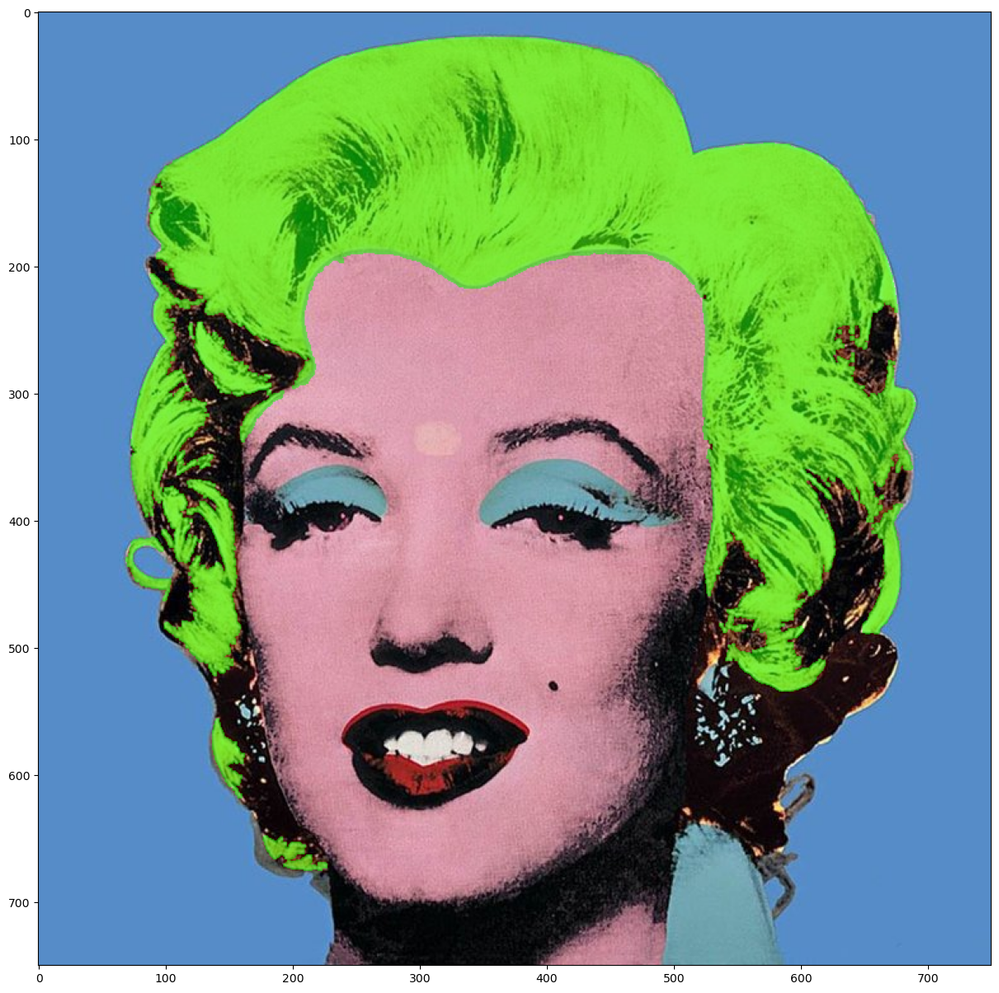

In [45]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import colorsys

# Function to convert RGB to HSV
def rgb_to_hsv(rgb):
    r, g, b = rgb[0] / 255.0, rgb[1] / 255.0, rgb[2] / 255.0
    hsv = colorsys.rgb_to_hsv(r, g, b)
    h, s, v = hsv[0] * 179, hsv[1] * 255, hsv[2] * 255
    return (h,s,v)

# Load the image
image = cv2.imread('Marilyn_blue.png')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  

# Create a black image with the same dimensions as the original image
mask = np.zeros_like(image)

# Applying the mask to the image
roi_image = cv2.bitwise_and(image, mask)

# Convert the ROI to HSV
hsv_roi = cv2.cvtColor(image, cv2.COLOR_RGB2HSV) 

# Define the HSV range for the hair color
rgb_value=(250,215,111)  #颜色改了
hsv_value = rgb_to_hsv(rgb_value)
tolerance = 70
lower_color = np.clip([hsv_value[0] - tolerance, hsv_value[1] - tolerance, hsv_value[2] - tolerance], 0, 255)
upper_color = np.clip([hsv_value[0] + tolerance, hsv_value[1] + tolerance, hsv_value[2] + tolerance], 0, 255)

# Create a mask for the hair color
mask_hair = cv2.inRange(hsv_roi, lower_color, upper_color)

# Apply Gaussian blur to the mask
blurred_mask = cv2.GaussianBlur(mask_hair, (3, 3), 0)

# Find the contours of the hair
contours, _ = cv2.findContours(blurred_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# Define the minimum contour area
min_contour_area = 300  

# Draw the contours on the image
for contour in contours:
    if cv2.contourArea(contour) > min_contour_area:
        cv2.drawContours(roi_image, [contour], -1, (0, 255, 0), 2)

# Define the new color and the alpha value
new_color = (0, 255, 0)  # This should be a tuple, not a numpy array
alpha = 0.5  # Adjust this value as needed

# Create a copy of the original image
image_copy = image.copy()

# Draw and fill the contours on the image
for contour in contours:
    if cv2.contourArea(contour) > min_contour_area:
        cv2.drawContours(image_copy, [contour], -1, new_color, -1)

# Perform alpha blending
blended_image = cv2.addWeighted(image, 1 - alpha, image_copy, alpha, 0)

hair_contours = [contour for contour in contours if cv2.contourArea(contour) > min_contour_area]

# Display the image
plt.figure(figsize=(15, 15))
plt.imshow(blended_image)
plt.show()


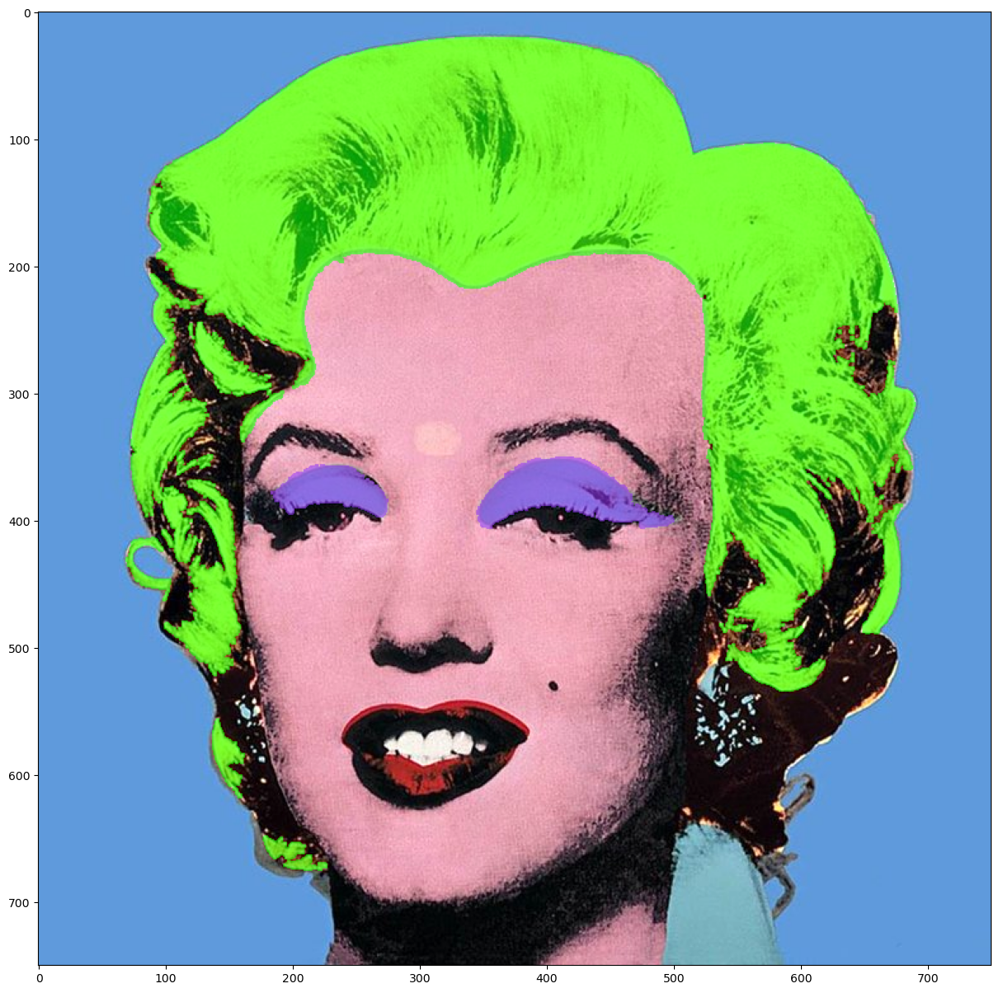

In [52]:

# Create a copy of the original image
image_copy = image.copy()

# Draw and fill the eyeshadow contours on the image
for contour in eyeshadow_contours:
    cv2.drawContours(image_copy, [contour], -1, (138,43,226), -1)

# Draw and fill the hair contours on the image
for contour in hair_contours:
    cv2.drawContours(image_copy, [contour], -1, new_color, -1)

# Perform alpha blending
blended_image = cv2.addWeighted(image, 1 - alpha, image_copy, 0.6, 0)

# Display the image
plt.figure(figsize=(15, 15))
plt.imshow(blended_image)
plt.show()
